<a href="https://colab.research.google.com/github/gyonar/Dog-Breed-Classification/blob/main/Dog_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# End to End Multi-Class Dog Breed Classification

This notebook builds an end to end multiclass dog breed classifier using TensorFlow 2.0 and Tensor flow Hub
## Problem Statement :
Identifying the breed of a dog given an image of a dog

## Data:
This is based on the Kaggle competition dataset -
**DOG BREED IDENTIFICATION**
You are provided with a training set and a test set of images of dogs. Each image has a filename that is its unique id. The dataset comprises 120 breeds of dogs. The goal of the competition is to create a classifier capable of determining a dog's breed from a photo.

## Evaluation:
The competition is evaluated on Multi Class Log Loss between the predicted probability and the observed target.
For each image in the test set, you must predict a probability for each of the different breeds in the following format

id,affenpinscher,afghan_hound,..,yorkshire_terrier
000621fb3cbb32d8935728e48679680e,0.0083,0.0,...,0.0083
etc.

Multi-Class Log Loss is a widely used performance metric for evaluating classification models with multiple classes. It measures the dissimilarity between predicted probabilities and actual class labels.

Formula: log_loss = — (1/N) * ∑(Y_true * log(Y_pred))

## Features
1.   We are dealing with unstructured data ie images of dogs
2.   The data set tells there are over 120 breeds of dogs ie 120 classes
1.   There are over 10000+ images in the training and test sets, where the images in the training set have unique ids which match to the breed in the labels.csv file





In [1]:
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("TF Hub version:", hub.__version__)
print("GPU", "available " if tf.config.list_physical_devices("GPU") else "not avaliable")

TF version: 2.12.0
TF Hub version: 0.13.0
GPU not avaliable


In [2]:
print(tf.config.list_physical_devices("GPU"))


[]


In [3]:
## Converting images into tensors

In [4]:
import pandas as pd
labels_csv = pd.read_csv("drive/My Drive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


<Axes: >

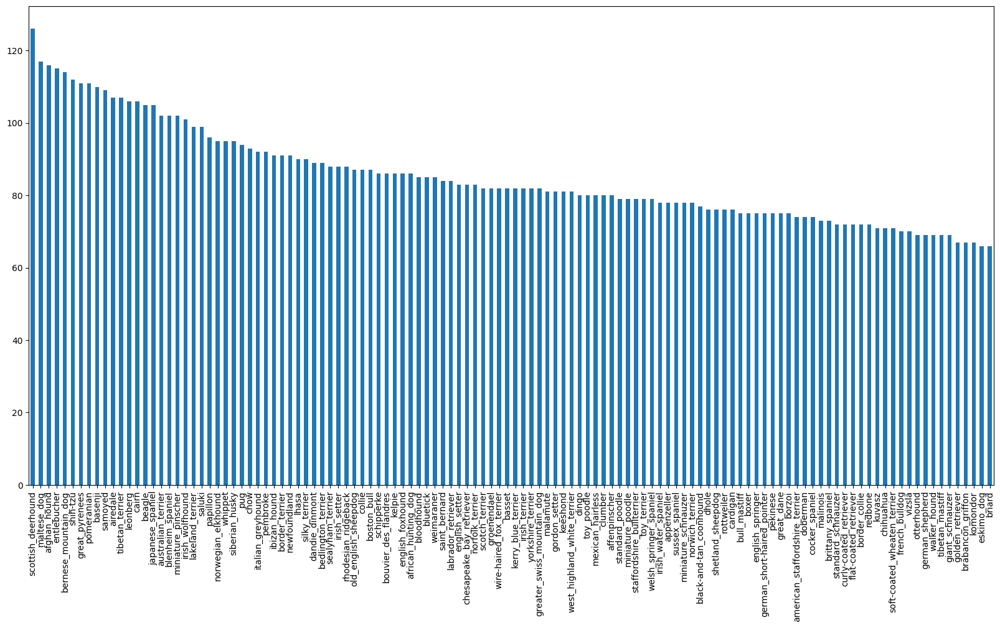

In [5]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10))

In [6]:
labels_csv["breed"].value_counts().mean()


85.18333333333334

It means that each class has on average 85 images. Google recommends 10 images per class for good model

In [7]:
# Example image
#from IPython.display import Image
#Image("drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")


In [8]:
filenames = ["drive/My Drive/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]
# a list of file names

In [9]:
filenames[:10]

['drive/My Drive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [10]:
import os
#if len(os.listdir("drive/My Drive/Dog Vision/train/")) == len(filenames):
  #print("Filenames match actual amount of files, Proceed.")
#else:
  #print("Filenames do no match actual amount of files, check the target directory.")

In [11]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [12]:
unique_breeds = np.unique(labels)
len(unique_breeds)


120

In [13]:
boolean_labels = np.array([label == unique_breeds for label in labels])
boolean_labels[:3]

array([[False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False],
       [False, False, False, False, False, Fals

create an array of boolean values for each image corresponding to each labe. that is an array of 10222*120 values

In [14]:
boolean_labels.shape

(10222, 120)

In [15]:
labels[0]

'boston_bull'

In [16]:
boolean_labels = boolean_labels.astype(int)

In [17]:
boolean_labels

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

In [18]:
boolean_labels.dtype

dtype('int64')

### Create Validation Set

In [19]:
X = filenames
y = boolean_labels
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [20]:
X_train[:5], y_train[:2]

(['drive/My Drive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/My Drive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/My Drive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/My Drive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/My Drive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0

### Turn Images into Tensors

In [21]:
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [22]:
image[:2]

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)

In [23]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

A function to:

1.   Take an image filepath as input
2.   Use TensorFlow to read the file and save it to a variable, image

1.   Turn our image (a jpg) into Tensors
2.   Normalize our image (convert color channel values from from 0-255 to 0-1).

1.   Resize the image to be a shape of (224, 224)
2.   Return the modified image


In [24]:
IMG_SIZE = 224

def process_image(image_path, img_size=IMG_SIZE):
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with RGB channels
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values
  # NOrmalisation
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

Turn data into batches

In [25]:
 def get_image_label(image_path, label):
  image = process_image(image_path)
  return image, label
# calling this function calls the previous function too

In [26]:
BATCH_SIZE = 32

def create_data_batches(X, y=None,
                        batch_size=BATCH_SIZE,
                        valid_data=False,
                        test_data=False):
  # If the data is a test dataset, we don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples
    # Turns the image path into a preprocessed image
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [27]:
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [28]:
train_data.element_spec

(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 120), dtype=tf.int64, name=None))

## Visualising the Data Batch

In [29]:
import matplotlib.pyplot as plt

def show_25_images(images, labels):
  plt.figure(figsize=(10, 10))
  for i in range(25):
    ax = plt.subplot(5, 5, i+1)
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")

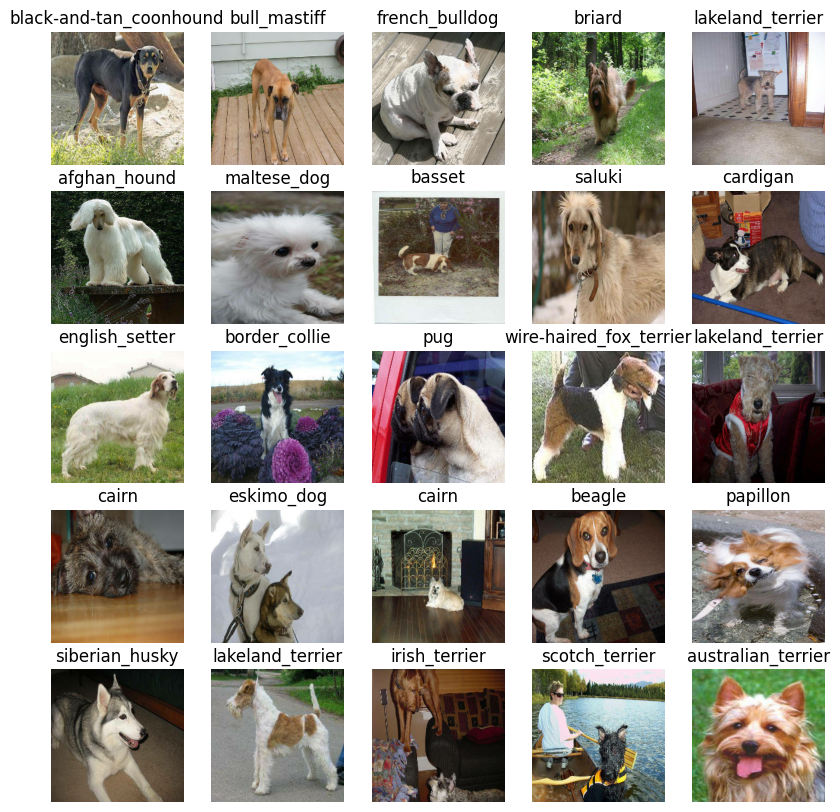

In [30]:
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

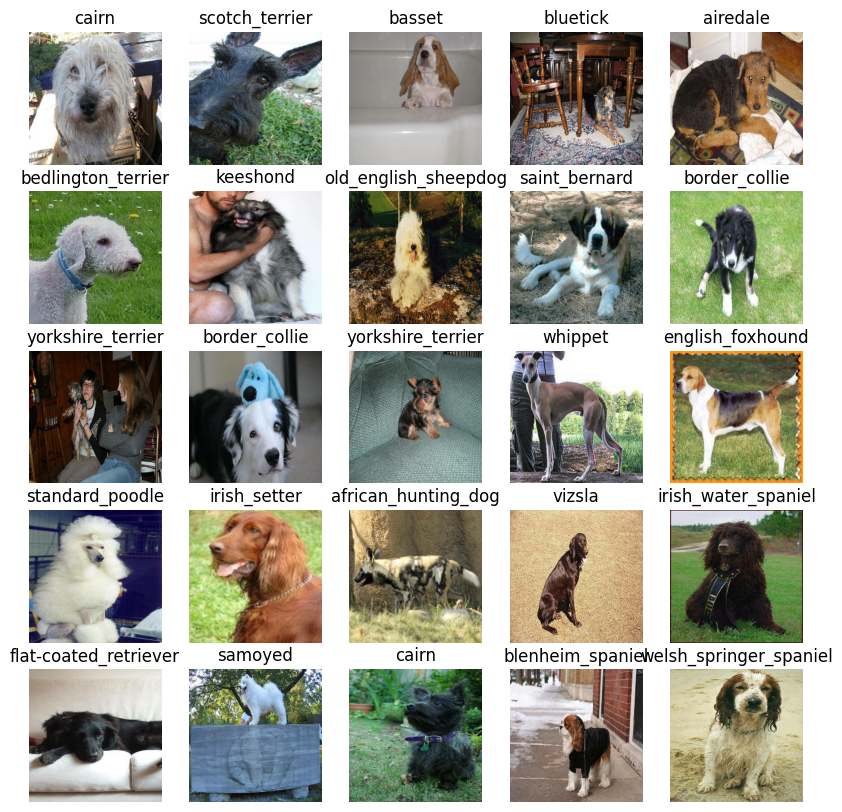

In [31]:
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a Model
Using Transfer Learning

In [32]:
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]
# batch, height, width, colour channels
OUTPUT_SHAPE = len(unique_breeds)
# Using transfer Learning with a pre-existing model
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"
# Using monbile neat v2 model

Keras Model- Sequential model

In [33]:
def create_model(input_shape=INPUT_SHAPE,
                 output_shape=OUTPUT_SHAPE,
                 model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [34]:
model =create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Callback

In [35]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [36]:
import datetime

def create_tensorboard_callback():
  # Create a log directory
  logdir = os.path.join("drive/My Drive/Dog Vision/logs",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

In [37]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Train Model

In [38]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [39]:
def train_model():
  model = create_model()

  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  return model

In [40]:
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 334s 13s/step - loss: 4.7153 - accuracy: 0.0988 - val_loss: 3.5906 - val_accuracy: 0.2500
Epoch 2/100
25/25 [==============================] - 64s 3s/step - loss: 1.7258 - accuracy: 0.6812 - val_loss: 2.2351 - val_accuracy: 0.5150
Epoch 3/100
25/25 [==============================] - 67s 3s/step - loss: 0.5962 - accuracy: 0.9312 - val_loss: 1.7270 - val_accuracy: 0.5900
Epoch 4/100
25/25 [==============================] - 64s 3s/step - loss: 0.2653 - accuracy: 0.9912 - val_loss: 1.5398 - val_accuracy: 0.6150
Epoch 5/100
25/25 [==============================] - 67s 3s/step - loss: 0.1561 - accuracy: 0.9975 - val_loss: 1.4619 - val_accuracy: 0.6100
Epoch 6/100
25/25 [==============================] - 67s 3s/step - loss: 0.1046 - accuracy: 0.9987 - val_loss: 1.4104 - val_accuracy: 0.6350
Epoch 7/100
25/25 [==============================] - 67s 3s

Check the Tensorboard Logs

In [41]:
%tensorboard --logdir drive/My\ Drive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Predictions

In [42]:
predictions = model.predict(val_data, verbose=1)
predictions.shape

7/7 [==============================] - 22s 1s/step


(200, 120)

In [43]:
index = 0
print(f"Max value (Confidence Levels): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

Max value (Confidence Levels): 0.31221747398376465
Sum: 0.9999999403953552
Max index: 26
Predicted label: cairn


In [44]:
def get_pred_label(prediction_probabilities):
  return unique_breeds[np.argmax(prediction_probabilities)]

In [45]:
pred_label = get_pred_label(predictions[0])
pred_label

'cairn'

In [46]:
def unbatchify(data):
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels
# returns batch tensors to images and labels

In [47]:
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Function to plot the predicted label, its predicted probability, the truth label and the target image on a single plot.

In [48]:
def plot_pred(prediction_probabilities, labels, images, n):

  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  if pred_label == true_label:
    color = "green" # if correct
  else:
    color = "red" # if wrong

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

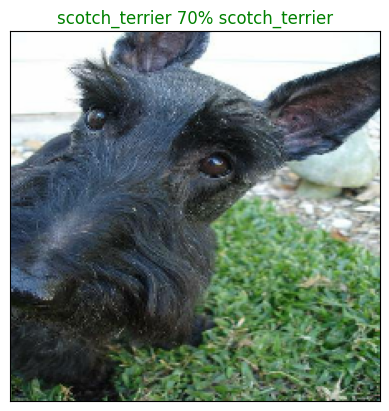

In [49]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=1)

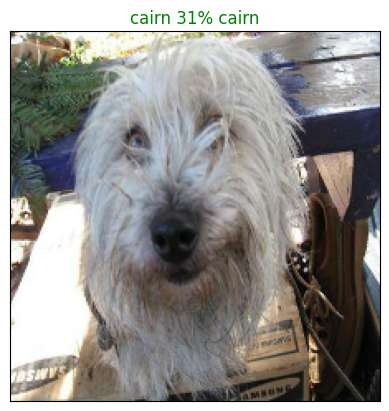

In [50]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=0)

In [51]:
# Plot the top ten prediction probabilities

def plot_pred_conf(prediction_probabilities, labels, n=1):

  pred_prob, true_label = prediction_probabilities[n], labels[n]

  pred_label = get_pred_label(pred_prob)
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]   #index
  top_10_pred_values = pred_prob[top_10_pred_indexes]     #values
  top_10_pred_labels = unique_breeds[top_10_pred_indexes] # labels

  # plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass


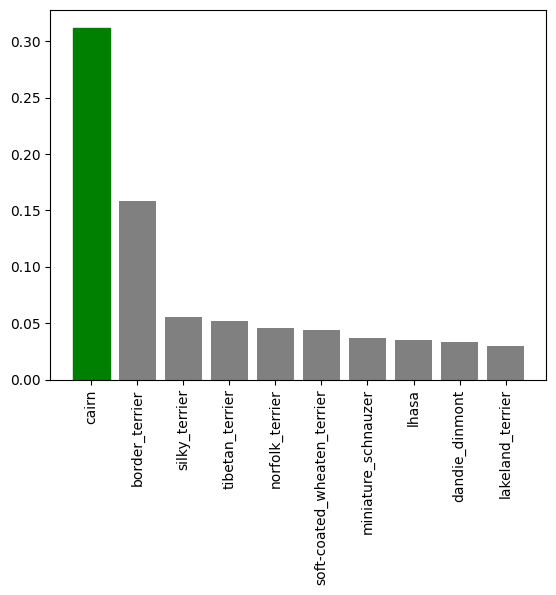

In [52]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=0)

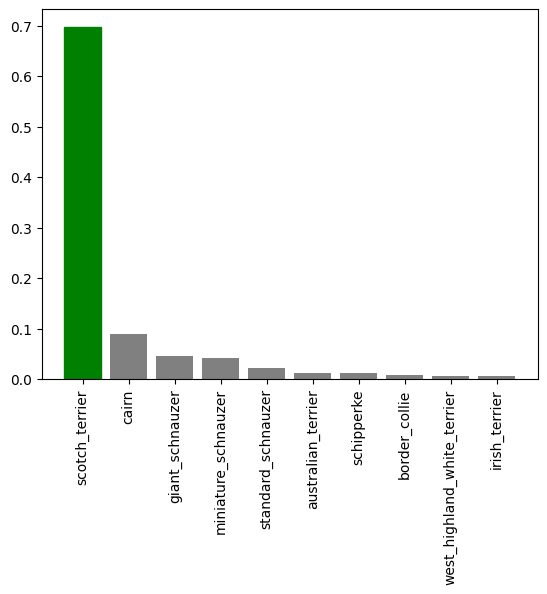

In [53]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=1)

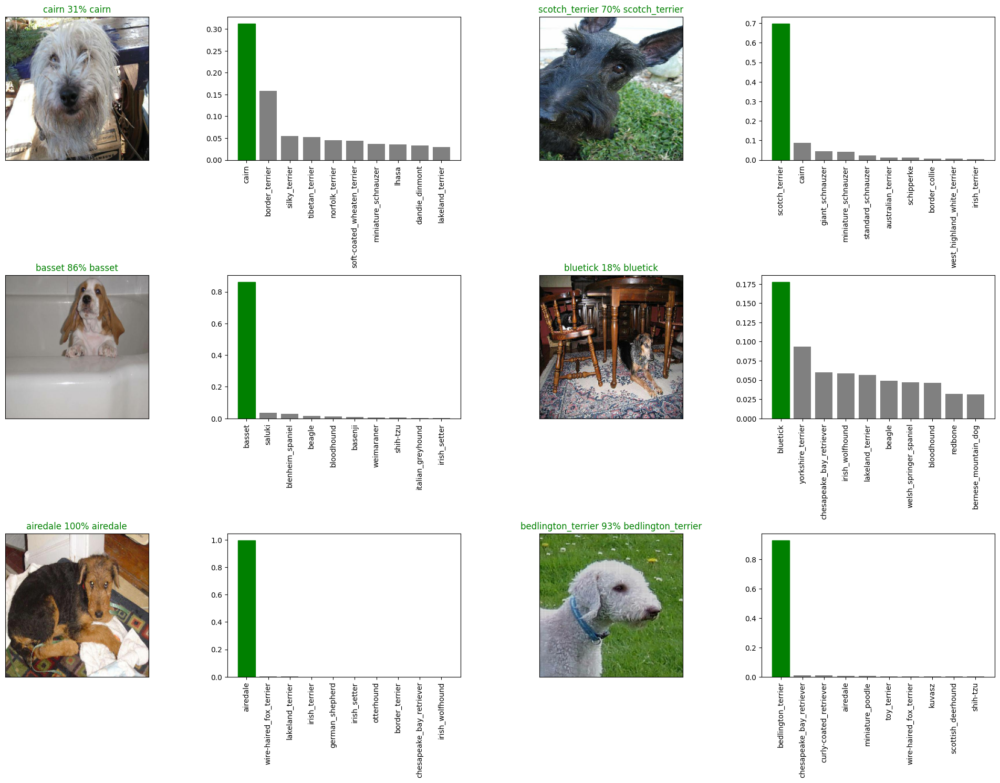

In [54]:
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and Reload Model

In [55]:
def save_model(model, suffix=None):
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/My Drive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5"
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [56]:
def load_model(model_path):
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [57]:
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/My Drive/Dog Vision/models/20230713-05001689224445-1000-images-mobilenetv2-Adam.h5...


'drive/My Drive/Dog Vision/models/20230713-05001689224445-1000-images-mobilenetv2-Adam.h5'

In [58]:
loaded_1000_image_model = load_model('drive/My Drive/Dog Vision/models/20230712-19091689188947-1000-images-mobilenetv2-Adam.h5')


Loading saved model from: drive/My Drive/Dog Vision/models/20230712-19091689188947-1000-images-mobilenetv2-Adam.h5


In [59]:
# Evaluate the pre-saved model and new model
model.evaluate(val_data),loaded_1000_image_model.evaluate(val_data)


7/7 [==============================] - 12s 2s/step - loss: 1.2989 - accuracy: 0.6500


([1.2873190641403198, 0.6700000166893005],
 [1.2988530397415161, 0.6499999761581421])

## Train Model on Full Data

In [60]:
len(X), len(y)

(10222, 10222)

In [61]:
# Create data batch
full_data = create_data_batches(X, y)
full_data

Creating training data batches...


<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.int64, name=None))>

In [62]:
# Create a model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [63]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)


In [64]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 2625s 8s/step - loss: 1.3166 - accuracy: 0.6733
Epoch 2/100
320/320 [==============================] - 604s 2s/step - loss: 0.3968 - accuracy: 0.8795
Epoch 3/100
320/320 [==============================] - 626s 2s/step - loss: 0.2361 - accuracy: 0.9373
Epoch 4/100
320/320 [==============================] - 627s 2s/step - loss: 0.1519 - accuracy: 0.9656
Epoch 5/100
320/320 [==============================] - 596s 2s/step - loss: 0.1060 - accuracy: 0.9785
Epoch 6/100
320/320 [==============================] - 618s 2s/step - loss: 0.0764 - accuracy: 0.9877
Epoch 7/100
320/320 [==============================] - 613s 2s/step - loss: 0.0594 - accuracy: 0.9908
Epoch 8/100
320/320 [==============================] - 616s 2s/step - loss: 0.0460 - accuracy: 0.9946
Epoch 9/100
320/320 [==============================] - 615s 2s/step - loss: 0.0365 - accuracy: 0.9967
Epoch 10/100
320/320 [==============================] - 624s 2s/step - loss: 0.03

NotFoundError: ignored

In [65]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")


Saving model to: drive/My Drive/Dog Vision/models/20230713-08351689237335-full-image-set-mobilenetv2-Adam.h5...


'drive/My Drive/Dog Vision/models/20230713-08351689237335-full-image-set-mobilenetv2-Adam.h5'

In [66]:
loaded_full_model = load_model('/content/drive/MyDrive/Dog Vision/models/20230713-08351689237335-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/MyDrive/Dog Vision/models/20230713-08351689237335-full-image-set-mobilenetv2-Adam.h5


## Making Predictions On test

In [67]:
test_path = "drive/My Drive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10], len(test_filenames)

(['drive/My Drive/Dog Vision/test/e42e9ceb31ec428968e88b556a92e858.jpg',
  'drive/My Drive/Dog Vision/test/e2915c191c0bc761b795b78f66845fe0.jpg',
  'drive/My Drive/Dog Vision/test/e5ad4cc7818e4eed04d209da177afa6f.jpg',
  'drive/My Drive/Dog Vision/test/e411a1b3681604f6321af7cb8e8f2de7.jpg',
  'drive/My Drive/Dog Vision/test/e0e47873420b2ed420e920a74c663233.jpg',
  'drive/My Drive/Dog Vision/test/dcb6ce994241db517c1ebe42897db826.jpg',
  'drive/My Drive/Dog Vision/test/e0c11786a50ce49abdb71397d711ecc9.jpg',
  'drive/My Drive/Dog Vision/test/e78b4a09e5f86c330e24c6aaed63f0be.jpg',
  'drive/My Drive/Dog Vision/test/e2d65ef41ec9a649c8dbd92f0b821163.jpg',
  'drive/My Drive/Dog Vision/test/e29d2336a8559d96973c874c9c6c17c6.jpg'],
 10357)

In [69]:
# create test data batch
test_data = create_data_batches(test_filenames, test_data=True)
test_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [73]:
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 618s 2s/step


In [76]:
test_predictions

array([[8.2245592e-11, 2.6285365e-11, 2.1488310e-10, ..., 1.7372151e-06,
        1.0591714e-13, 2.1064119e-11],
       [1.1354935e-08, 3.5242956e-06, 1.9366526e-08, ..., 1.4999756e-04,
        9.1761663e-05, 3.2837130e-07],
       [2.5500835e-09, 8.8090167e-07, 7.2802688e-09, ..., 2.0192773e-04,
        1.0217713e-04, 4.9518580e-06],
       ...,
       [4.5421389e-11, 1.6087121e-03, 2.6220084e-07, ..., 2.8635742e-07,
        9.3420743e-11, 1.9907735e-07],
       [3.9640630e-14, 4.0287240e-10, 4.5953731e-12, ..., 4.0709165e-09,
        3.4334150e-07, 3.6624094e-12],
       [9.2091515e-13, 1.5320473e-10, 3.8260460e-08, ..., 5.2356986e-06,
        4.5917261e-09, 4.7227812e-11]], dtype=float32)

In [77]:
np.savetxt("drive/My Drive/Dog Vision/preds_array.csv", test_predictions, delimiter=",")

to save our model from runtime disconnects


In [78]:
test_predictions = np.loadtxt("drive/My Drive/Dog Vision/preds_array.csv", delimiter=",")


In [79]:
test_predictions.shape


(10357, 120)

## Evaluation:
The competition is evaluated on Multi Class Log Loss between the predicted probability and the observed target.
For each image in the test set, you must predict a probability for each of the different breeds in the following format

id,affenpinscher,afghan_hound,..,yorkshire_terrier
000621fb3cbb32d8935728e48679680e,0.0083,0.0,...,0.0083
etc.

We now prepare the output in this format

In [80]:
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [83]:
os.path.splitext(test_filenames[0])[0]

'drive/My Drive/Dog Vision/test/e42e9ceb31ec428968e88b556a92e858'

In [82]:
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e42e9ceb31ec428968e88b556a92e858,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e2915c191c0bc761b795b78f66845fe0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e5ad4cc7818e4eed04d209da177afa6f,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e411a1b3681604f6321af7cb8e8f2de7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e0e47873420b2ed420e920a74c663233,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [84]:
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e42e9ceb31ec428968e88b556a92e858,8.224559e-11,2.628536e-11,2.148831e-10,4.186972e-09,1.299550e-04,2.492979e-07,1.134400e-09,5.809260e-11,2.890223e-10,...,1.047466e-07,1.489660e-08,3.734581e-06,1.156440e-10,7.322314e-05,8.735399e-11,1.144260e-11,1.737215e-06,1.059171e-13,2.106412e-11
1,e2915c191c0bc761b795b78f66845fe0,1.135493e-08,3.524296e-06,1.936653e-08,5.267695e-07,1.678220e-09,3.303476e-07,1.914195e-09,2.113591e-08,8.020969e-09,...,4.993048e-04,5.477136e-08,8.192194e-08,1.173423e-06,2.797889e-07,1.150369e-08,3.351665e-08,1.499976e-04,9.176166e-05,3.283713e-07
2,e5ad4cc7818e4eed04d209da177afa6f,2.550083e-09,8.809017e-07,7.280269e-09,1.139028e-06,7.485959e-04,2.095969e-06,2.149568e-07,6.734722e-07,7.146285e-08,...,1.640295e-06,4.910624e-06,3.310950e-01,3.089556e-04,1.798133e-06,5.649417e-07,5.643209e-09,2.019277e-04,1.021771e-04,4.951858e-06
3,e411a1b3681604f6321af7cb8e8f2de7,3.647964e-09,1.204277e-09,1.187615e-04,5.791324e-05,1.265296e-05,5.022789e-06,3.836434e-07,1.401974e-02,9.659367e-01,...,1.929312e-07,4.469861e-05,4.823588e-08,2.298721e-06,4.932014e-06,2.017965e-03,2.093226e-05,3.273523e-06,6.322213e-09,2.094327e-06
4,e0e47873420b2ed420e920a74c663233,1.000873e-13,4.153658e-10,1.120598e-13,1.939750e-13,7.955098e-11,1.054028e-13,1.603576e-13,7.903407e-14,1.083627e-13,...,1.771705e-14,1.484535e-12,1.955904e-12,5.041240e-10,2.997502e-10,5.774695e-14,4.859409e-13,7.468841e-13,7.199685e-19,9.442057e-13


In [85]:
preds_df.to_csv("drive/My Drive/Dog Vision/full_model_predictions_submission.csv",
                index=False)

## Custom Images

In [88]:
custom_path = "drive/My Drive/Dog Vision/custom photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [89]:
custom_image_paths

['drive/My Drive/Dog Vision/custom photos/dog photo 2.jpeg',
 'drive/My Drive/Dog Vision/custom photos/dog photo 3.jpeg',
 'drive/My Drive/Dog Vision/custom photos/dog photo 1.jpeg']

In [90]:
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [91]:
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 1s/step


In [92]:
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['lhasa', 'wire-haired_fox_terrier', 'labrador_retriever']

In [93]:
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

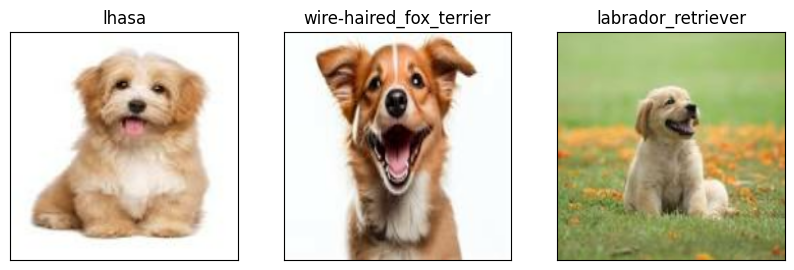

In [94]:
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)